In [1]:
!pip install -q git+https://github.com/tensorflow/docs

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
!pip install pyreadr

     |████████████████████████████████| 261 kB 415 kB/s eta 0:00:01
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [3]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
# %matplotlib inline

from urllib.parse import urljoin
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV, KFold, train_test_split

import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

import pyreadr

IS_COLAB = 'google.colab' in sys.modules

# palabras a buscar en columna descripción
TEXT_MINING_KEYWORDS = ['balcon', 'cochera', 'sum', 'parrilla', 'pileta']

# url repositorio
GITHUB_REPOSITORY_URL = 'https://github.com/arielfaur/prediccion-precio-propiedades-fmap-2020/raw/master/'
BASE_URL_DATA = GITHUB_REPOSITORY_URL if IS_COLAB else ''

# global seeds
np.random.seed(1234)
tf.random.set_seed(1234)


def vectorize_descripcion(df: pd.DataFrame):
    
    # entrenamos el modelo para buscar las keywords
    vectorizer = CountVectorizer(binary=True, strip_accents='unicode')  
    vectorizer.fit(TEXT_MINING_KEYWORDS)

    # hot encoding de los resultados
    desc = vectorizer.transform(df['descripcion'])

    # crear dataframe con resultados
    df_desc = pd.DataFrame(data=desc.toarray(), columns=vectorizer.get_feature_names())
    return pd.concat([df.reset_index(drop=True), df_desc.reset_index(drop=True)], axis=1, sort=False)

def get_outliers(df: pd.DataFrame):
    return df[df_train['id'].isin(['7798', '31417', '10764', '12865', '22126', '49492'])]

def remove_outliers(df: pd.DataFrame):
    outliers = get_outliers(df)
    df.drop(outliers.index, inplace=True)

def preprocessing(df: pd.DataFrame, process_outliers = True):
    # nombres features en minuscula
    df.columns = map(str.lower, df.columns)

    df['barrio'] = df['barrio'].astype('category')
    df['cluster'] = df['cluster'].astype('category')
    df['id'] = df['id'].astype('int')
    
    # guardar los id
    ids = df['id']
    
    # eliminar outliers
    if process_outliers:
        remove_outliers(df)
    
    # text mining buscar keywords en descripcion
    df['descripcion'].fillna('', inplace=True)
    df = vectorize_descripcion(df)
    
    # eliminar columnas innecesarias del modelo
    df.drop([
        'banios',
        # 'barrio', 
        'subbarrio',
        'descripcion',
        'p_mt2', 
        'n_bancos',
        'n_barrios_p', 
        'n_bici', 
        'n_boliches', 
        'n_clinicas', 
        'n_comisarias',
        'n_embajadas', 
        'n_gasolina', 
        'n_gastronomica', 
        'n_homicidios',
        'n_hospitales', 
        'n_hurtos', 
        'n_hurtos_auto',
        'n_robo', 
        'n_robo_vehi',
        'n_subte_bocas', 
        'n_uni',
        'cluster',
        # 'terraza',
        'lujo',
        'sup_cubierta'
    ],axis=1, inplace=True, errors='raise')


    return ids, df.set_index('id')


def split_data(df: pd.DataFrame, test_size = 0.05):
    y = df[['precio']]
    X = df.drop(['precio'], axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state=5)
    return X_train, X_test, y_train, y_test


## Preprocesamiento de los features: imputación, estandarización, one-hot encoding
def make_transformer_pipeline():
    numeric_transformer = make_pipeline( 
        SimpleImputer(missing_values = np.nan, strategy='mean'),
        StandardScaler(),
    )

    categorical_transformer = make_pipeline(
        #SimpleImputer(strategy='constant', fill_value='missing'),
        #SimpleImputer(strategy="most_frequent"),
        #KNNImputer(n_neighbors=3, weights="uniform"),     # KNNImputer tarda una eternidad...
        OneHotEncoder(handle_unknown='ignore')
    )

    return make_column_transformer(
        (numeric_transformer, make_column_selector(dtype_include=['int64', 'float64'])),
        (categorical_transformer, make_column_selector(dtype_include=['category']))
    )    

def baseline_ada_model_pipeline():
    transformer = make_transformer_pipeline()
    ada = AdaBoostRegressor(random_state = 5)
    
    return make_pipeline(transformer, TransformedTargetRegressor(ada, func=np.log, inverse_func=np.exp))    

def create_train_ada_model():
    transformer = make_transformer_pipeline()

    model = Pipeline([
        ('preprocessing', transformer),
        ('model', TransformedTargetRegressor(AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), loss='square', random_state=5), func=np.log, inverse_func=np.exp))
    ])
    return model

# # Crear modelo red neuronal Keras
# def build_1layer_keras_model(input_dim, n_neurons = 8):    
#     model = keras.Sequential()
#     model.add(layers.Dense(n_neurons, activation='relu', input_dim=input_dim))
#     model.add(layers.Dense(1))
#     model.compile(loss='mean_squared_error', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

#     return model

# Crear modelo red neuronal Keras
def build_dense_keras_model(input_dim, n_neurons = [8, 8], lr = 0.001, dropout = False):
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

    model = keras.Sequential()
    for idx, n in enumerate(n_neurons):
        if idx==0:
            model.add(layers.Dense(n, activation='relu', kernel_initializer='random_normal', input_dim=input_dim))
            if dropout: model.add(layers.Dropout(.1))
        else:
            model.add(layers.Dense(n, activation='relu', kernel_initializer='random_normal'))
            if dropout: model.add(layers.Dropout(.1))
                
    model.add(layers.Dense(1, kernel_initializer='random_normal'))
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

# # Pipeline preprocesamiento para red neuronal
# def create_keras_pipeline():
#     EPOCHS = 300
#     BATCH_SIZE = 32

#     transformer = make_transformer_pipeline()
#     pipeline = Pipeline([
#         ('preprocessing', transformer),
#         ('model', TransformedTargetRegressor(KerasRegressor(build_fn=build_1layer_keras_model, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=1), 
#         transformer=QuantileTransformer(output_distribution='normal', random_state=5)
#         ))
#     ])
#     return pipeline

# Graficar predicciones
def plot_test_predictions(y_test, y_pred):
    # graficar predicciones contra datos actuales
    fig, ax = plt.subplots(figsize = (18,10))
    ax.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
    ax.set_xlabel('Precio test')
    ax.set_ylabel('Precio predicción')
    plt.show()

def read_rds(filename):
    result = pyreadr.read_r(filename)
    return result[None]

# Cargar datos entrenamiento

In [4]:
df_train = read_rds(urljoin(BASE_URL_DATA,'data_train_def.rds'))

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20371 entries, 0 to 20370
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20371 non-null  object 
 1   lat             20371 non-null  float64
 2   lon             20371 non-null  float64
 3   precio          20371 non-null  float64
 4   BARRIO          20371 non-null  object 
 5   n_uni           20371 non-null  int32  
 6   n_boliches      20371 non-null  int32  
 7   n_clinicas      20371 non-null  int32  
 8   n_hospitales    20371 non-null  int32  
 9   sup_cubierta    20371 non-null  float64
 10  n_comisarias    20371 non-null  int32  
 11  n_embajadas     20371 non-null  int32  
 12  n_subte_bocas   20371 non-null  int32  
 13  n_barrios_p     20371 non-null  int32  
 14  n_bici          20371 non-null  int32  
 15  n_bancos        20371 non-null  int32  
 16  A_Estrenar      20371 non-null  float64
 17  banios          20371 non-null 

In [6]:
df_train.describe()

,lat,lon,precio,n_uni,n_boliches,n_clinicas,n_hospitales,sup_cubierta,n_comisarias,n_embajadas,...,n_hurtos,n_hurtos_auto,n_robo,dormitorios,n_robo_vehi,p_mt2,lujo,sup_total,habitaciones,terraza
count,20371.000000,20371.000000,2.037100e+04,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,...,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.00000,20371.000000
mean,-34.598249,-58.440195,1.352987e+05,4.158706,4.099013,2.530460,0.690491,48.304693,1.218939,0.532080,...,312.300673,24.078592,398.034068,1.266261,4.940602,2863.588737,0.360463,48.306440,1.95631,0.300083
std,0.025411,0.036594,7.842911e+04,6.151475,5.276728,3.061518,1.012042,10.004436,0.900922,1.715158,...,261.213086,9.906815,249.341898,0.485115,5.031838,561.060440,0.480147,10.002366,0.73275,0.458305
min,-34.671610,-58.530467,2.000000e+04,0.000000,0.000000,0.000000,0.000000,35.020000,0.000000,0.000000,...,2.000000,0.000000,12.000000,1.000000,0.000000,1314.000000,0.000000,35.020000,1.00000,0.000000
25%,-34.617520,-58.466320,1.000000e+05,0.000000,0.000000,0.000000,0.000000,39.000000,1.000000,0.000000,...,148.000000,18.000000,214.000000,1.000000,2.000000,2367.000000,0.000000,39.000000,1.00000,0.000000
50%,-34.599672,-58.439346,1.280000e+05,2.000000,2.000000,1.000000,0.000000,47.000000,1.000000,0.000000,...,244.000000,24.000000,337.000000,1.000000,4.000000,2772.000000,0.000000,47.000000,2.00000,0.000000
75%,-34.579899,-58.412021,1.580000e+05,5.000000,7.000000,4.000000,1.000000,56.000000,2.000000,0.000000,...,351.000000,31.000000,511.000000,1.000000,6.000000,3373.000000,1.000000,56.000000,2.00000,1.000000
max,-34.528633,-58.357471,7.897000e+06,36.000000,26.000000,15.000000,8.000000,69.000000,5.000000,16.000000,...,2312.000000,91.000000,1758.000000,3.000000,49.000000,4163.250000,1.000000,69.000000,4.00000,1.000000


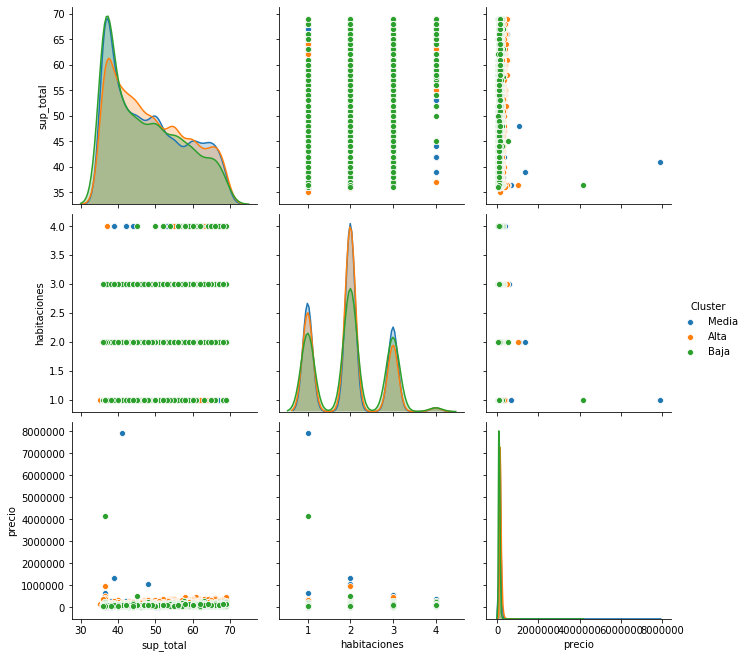

In [8]:
sns.pairplot(df_train, vars=['sup_total','habitaciones','precio'], hue='Cluster', height=3)

# Pipeline preprocesamiento

In [9]:
ids, df_train = preprocessing(df_train)
df_train.head()

,lat,lon,precio,barrio,a_estrenar,dormitorios,sup_total,habitaciones,terraza,balcon,cochera,parrilla,pileta,sum
id,,,,,,,,,,,,,,
4,-34.600886,-58.431204,145000.0,villa crespo,0.0,2.0,57.0,3.0,0.0,0,0,0,0,0
6,-34.572144,-58.480173,237000.0,villa urquiza,0.0,2.0,60.0,3.0,1.0,1,0,0,0,0
8,-34.563209,-58.468897,130000.0,coghlan,0.0,1.0,49.0,2.0,1.0,1,0,0,0,0
11,-34.555333,-58.466432,230000.0,nuñez,0.0,2.0,55.0,3.0,1.0,1,1,0,0,0
12,-34.629200,-58.452566,144900.0,flores,1.0,1.0,48.0,2.0,1.0,1,0,1,0,0


## Split data

In [10]:
test_size = round(2500 / len(df_train), 2)

print(f'Test {test_size*100}%')

X_train, X_test, y_train, y_test = split_data(df_train, test_size=test_size)


Test 12.0%


## Set entrenamiento

In [11]:
pipe = make_transformer_pipeline()
X_train = pipe.fit_transform(X_train).toarray()
y_train = y_train.values

X_train, y_train

(array([[ 0.84540209,  0.95209473, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.49640854,  0.63657231, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [-1.45550193, -0.73194261, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 1.13721597,  0.19559168, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.66476808,  0.33972116, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.53212571, -1.03902861, -0.39275613, ...,  0.        ,
          0.        ,  0.        ]]),
 array([[210000.],
        [205500.],
        [111000.],
        ...,
        [330000.],
        [196531.],
        [120000.]]))

## Set test

In [12]:
X_test = pipe.transform(X_test).toarray()
y_test = y_test.values

X_test, y_test

(array([[-0.73494283, -0.69005429, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.41036871,  0.6819018 , -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.70520299,  0.28688069, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [-0.85613596, -0.83351039,  2.54610923, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.41105679,  0.01476876, -0.39275613, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.93115019, -0.20168499, -0.39275613, ...,  0.        ,
          0.        ,  0.        ]]),
 array([[107200.],
        [130000.],
        [209000.],
        ...,
        [ 99000.],
        [130142.],
        [110000.]]))

# Modelo red densa Keras

In [19]:
EPOCHS = 500
BATCH_SIZE = 32
STEPS_PER_EPOCH = X_train.shape[0]//BATCH_SIZE
N_FOLDS = 5

initial_learning_rate = 0.01

lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  initial_learning_rate,
  decay_steps=STEPS_PER_EPOCH*25,
  decay_rate=1,
  staircase=False)


# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate,
#     decay_steps=15000,
#     decay_rate=0.95,
#     staircase=False)

# tfa.optimizers.AdamW(learning_rate=0.01, weight_decay=1e-4)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

initializer = tf.keras.initializers.he_uniform()    


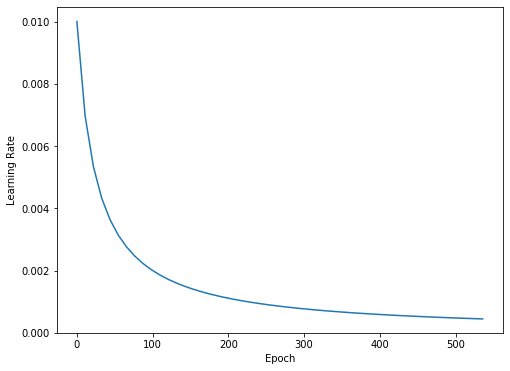

In [20]:
step = np.linspace(0,300000)
lr = lr_schedule(step)
plt.figure(figsize = (8,6))
plt.plot(step/STEPS_PER_EPOCH, lr)
plt.ylim([0,max(plt.ylim())])
plt.xlabel('Epoch')
_ = plt.ylabel('Learning Rate')

In [21]:
def create_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(256, activation='relu', kernel_initializer=initializer, kernel_regularizer=tf.keras.regularizers.l2(0.001), input_dim=X_train.shape[1]))
    # model.add(tf.keras.layers.Dropout(rate=.2))
    model.add(tf.keras.layers.Dense(256, activation='relu', kernel_initializer=initializer, kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    # model.add(tf.keras.layers.Dropout(rate=.2))
    model.add(tf.keras.layers.Dense(16, activation='relu', kernel_initializer=initializer, kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    model.add(tf.keras.layers.Dense(1))
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

In [22]:
# Callbacks #

# Parar entrenamiento cuando no mejora MSE
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=200)

# Guardar modelo entrenado
# checkpoint = tf.keras.callbacks.ModelCheckpoint('modelo_prediccion_propiedades.hdf5', monitor='val_loss', verbose=0, save_best_only=True, mode='auto')

# Reducir learning rate cuando no mejora MSE
# reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=50, min_lr=0.0001)

# Loop entrenamiento kfold cross-validation
kfold = KFold(n_splits=N_FOLDS, shuffle=True, random_state=5)
rmse_per_fold = []
loss_per_fold = []
train_history = []

fold_no = 1
for train, val in kfold.split(X_train, y_train):
    model = create_model()
    model.summary()

    print('------------------------------------------------------------------------')
    print(f'Entrenando fold {fold_no} ...')

    history = model.fit(X_train[train], y_train[train], 
      batch_size=BATCH_SIZE, 
      epochs=EPOCHS, 
      validation_data=(X_train[val], y_train[val]), 
      # steps_per_epoch = STEPS_PER_EPOCH, 
      callbacks=[
        tfdocs.modeling.EpochDots(),
        #checkpoint, 
        early_stop, 
        # reduce_lr 
      ], verbose=1)

    train_history.append(history)

    # Evaluar scores
    scores = model.evaluate(X_train[val], y_train[val], verbose=0)
    print(f'Score para fold {fold_no}: {model.metrics_names[0]} de {scores[0]}; {model.metrics_names[1]} de {scores[1]}')
    rmse_per_fold.append(scores[1])
    loss_per_fold.append(scores[0])

    tf.keras.backend.clear_session()

    fold_no = fold_no + 1


# SCORES #
print('------------------------------------------------------------------------')
print('Score por fold')
for i in range(0, len(rmse_per_fold)):
  print('------------------------------------------------------------------------')
  print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - RMSE: {rmse_per_fold[i]}')
print('------------------------------------------------------------------------')
print('Score promedio de todos los folds:')
print(f'> RMSE: {np.mean(rmse_per_fold)} (+- {np.std(rmse_per_fold)})')
print(f'> Loss: {np.mean(loss_per_fold)}')
print('------------------------------------------------------------------------')



82375424.0000 - root_mean_squared_error: 26122.3164 - val_loss: 919661888.0000 - val_root_mean_squared_error: 30325.9277
Epoch 310/500
560/560 [==============================] - 1s 2ms/step - loss: 671343104.0000 - root_mean_squared_error: 25910.2871 - val_loss: 920416896.0000 - val_root_mean_squared_error: 30338.3730
Epoch 311/500
560/560 [==============================] - 1s 2ms/step - loss: 678580288.0000 - root_mean_squared_error: 26049.5742 - val_loss: 919932544.0000 - val_root_mean_squared_error: 30330.3906
Epoch 312/500
560/560 [==============================] - 1s 2ms/step - loss: 675981952.0000 - root_mean_squared_error: 25999.6523 - val_loss: 918138304.0000 - val_root_mean_squared_error: 30300.7969
Epoch 313/500
560/560 [==============================] - 1s 2ms/step - loss: 668737600.0000 - root_mean_squared_error: 25859.9609 - val_loss: 918056960.0000 - val_root_mean_squared_error: 30299.4531
Epoch 314/500
560/560 [==============================] - 1s 2ms/step - loss: 679703

# Graficar métricas entrenamiento

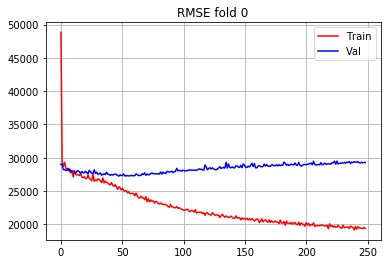

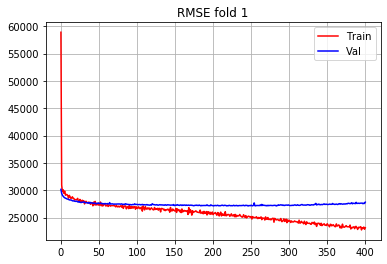

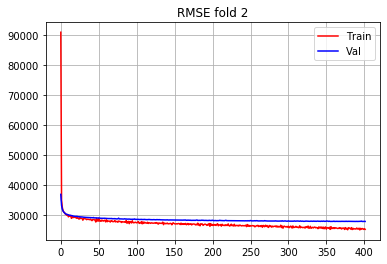

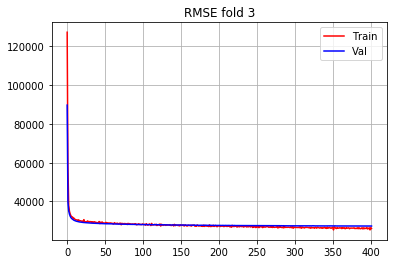

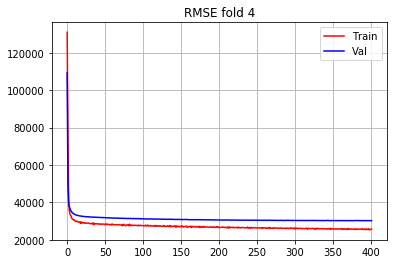

In [35]:
for idx, history in enumerate(train_history):
    train_rmse = history.history['root_mean_squared_error']
    val_rmse = history.history['val_root_mean_squared_error']

    plt.plot(np.linspace(0, len(train_rmse),  len(train_rmse)), train_rmse,
                color='red', label='Train')

    plt.plot(np.linspace(0, len(val_rmse), len(val_rmse)), val_rmse,
            color='blue', label='Val')

    plt.title(f'RMSE fold {idx}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [36]:
loss, rmse = model.evaluate(X_test, y_test, verbose=2)
print("Testing set RMSE: {:5.2f}".format(rmse))

77/77 - 0s - loss: 805759296.0000 - root_mean_squared_error: 28385.9004
Testing set RMSE: 28385.90


In [37]:
y_pred = model.predict(X_test).flatten()
y_pred

array([ 92270.41 , 153341.5  , 138502.14 , ..., 123295.44 , 116650.484,
       127422.64 ], dtype=float32)

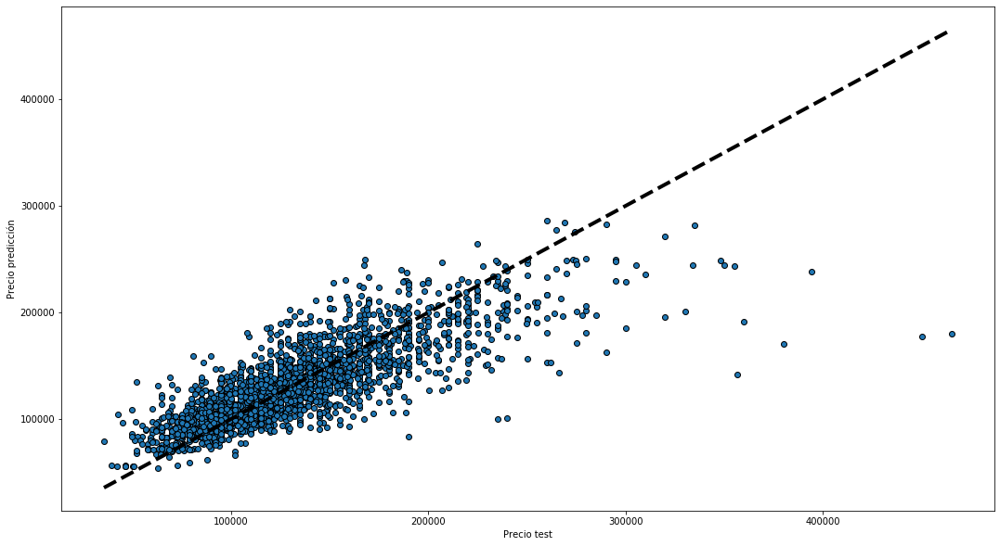

In [38]:
plot_test_predictions(y_test, y_pred)

# Preprocesamiento set de test

In [ ]:
df_test = read_rds(urljoin(BASE_URL_DATA,'data_test_def.rds'))
df_test.head()

In [ ]:
df_test.info()

In [ ]:
ids, df_test = preprocessing(df_test, process_outliers=False)

In [ ]:
df_test.head()

In [ ]:
df_test.drop(['precio'], axis=1, inplace=True)
df_test.head()

# Predicción con red neuronal

In [ ]:
X = pipe.transform(df_test)
X.shape

In [ ]:
y_pred = model.predict(X).flatten()
data = pd.DataFrame(data={'id' : ids.values, 'precio': np.round(y_pred).astype(int) })
data

In [ ]:
data.to_csv('propiedades_prediccion.csv', index=False)